In [1]:
import numpy as np
from tqdm.auto import tqdm, trange
import scipy as sp
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp
import scipy.optimize as op
import matplotlib.pyplot as plt
from numba import njit,jit,vectorize,cfunc
from numpy.random import default_rng, SeedSequence
from pydub import AudioSegment

In [2]:
rng = default_rng()

In [3]:
def randx(lowbound,highbound,dim=3):
    off = lowbound
    ma = highbound-off
    offs = np.ones(dim)*off
    return offs+(2*rng.random(size=dim)-np.ones(dim))*ma

In [4]:
def wuchua_transmitter(s,r,mu,b,m):
    fx = lambda t,x: s*(x[1]-x[0])
    fy = lambda t,x: (r-mu)*(x[0]+m(t))+mu*x[0]-x[1]-(x[0]+m(t))*x[2]
    fz = lambda t,x: (x[0]+m(t))*x[1]-b*x[2]
    return lambda t,x: np.array([fx(t,x),fy(t,x),fz(t,x)])

In [5]:
def wuchua_reciever(s,r,mu,b,m):
    fx = lambda t,x: s*(x[1]-x[0])
    fy = lambda t,x: (r-mu)*m(t)+mu*x[0]-x[1]-m(t)*x[2]
    fz = lambda t,x: m(t)*x[1]-b*x[2]
    return lambda t,x: np.array([fx(t,x),fy(t,x),fz(t,x)])

In [6]:
def cuomoppenheim_t(s,r,b):
    fx = lambda x: s*(x[1]-x[0])
    fy = lambda x: r*x[0]-x[1]-20*x[0]*x[2]
    fz = lambda x: 5*x[0]*x[1]-b*x[2]
    return lambda t,x: np.array([fx(x),fy(x),fz(x)])

In [7]:
def cuomoppenheim_r(r,b,m):
    fy = lambda t,x: r*m(t)-x[0]-20*m(t)*x[1]
    fz = lambda t,x: 5*m(t)*x[0]-b*x[1]
    return lambda t,x: np.array([fy(t,x),fz(t,x)])

In [13]:
def lorenz_t(s,r,b):
    fx = lambda x: s*(x[1]-x[0])
    fy = lambda x: r*x[0]-x[1]-x[0]*x[2]
    fz = lambda x: x[0]*x[1]-b*x[2]
    return lambda t,x: np.array([fx(x),fy(x),fz(x)])
def lorenz_r(r,b,m):
    fy = lambda t,x: r*m(t)-x[0]-m(t)*x[1]
    fz = lambda t,x: m(t)*x[0]-b*x[1]
    return lambda t,x: np.array([fy(t,x),fz(t,x)])

In [31]:
def rossler_t(a,b,c):
    fx = lambda x: x[1]+a*x[0]
    fy = lambda x: -(x[0]+x[2])
    fz = lambda x: x[1]*x[0]-b*(x[2]-c)
    return lambda t,x: np.array([fx(x),fy(x),fz(x)])
def rossler_r(a,b,c,m):
    fy = lambda t,x: -(m(t)+x[1])
    fz = lambda t,x: m(t)*x[0]-b*(x[1]-c)
    return lambda t,x: np.array([fy(t,x),fz(t,x)])

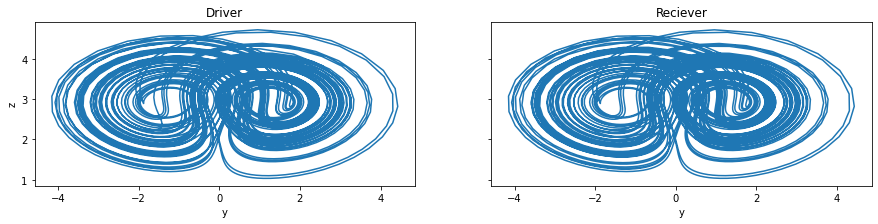

In [32]:
trans = cuomoppenheim_t(10,60,8/3)
solt = solve_ivp(trans,(0,50),randx(3,5),max_step=0.01)
ts = solt.t
xs = solt.y
x = interp1d(ts,xs[0])
rec = cuomoppenheim_r(60,8/3,x)
solr = solve_ivp(rec,(0,50),randx(3,5,dim=2),max_step=0.01)
ys = solr.y
fig, (ax0,ax1) = plt.subplots(1,2,sharex=True,sharey=True,figsize=(15,5))
ax0.set_title('Driver')
ax0.plot(*xs[[1,2]])
ax0.set_ylabel('z')
ax0.set_xlabel('y')
ax0.set_aspect(1)
ax1.set_title('Reciever')
ax1.plot(*ys)
ax1.set_xlabel('y')
ax1.set_aspect(1)
plt.savefig("cuomoppenheim.png")
plt.show()

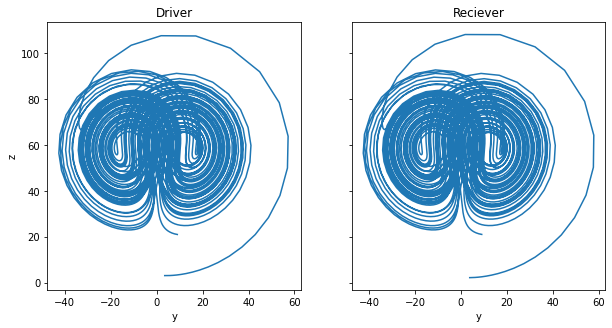

In [19]:
trans = lorenz_t(10,60,8/3)
solt = solve_ivp(trans,(0,50),randx(3,5),max_step=0.01)
ts = solt.t
xs = solt.y
x = interp1d(ts,xs[0])
rec = lorenz_r(60,8/3,x)
solr = solve_ivp(rec,(0,50),randx(3,5,dim=2),max_step=0.01)
ys = solr.y
fig, (ax0,ax1) = plt.subplots(1,2,sharex=True,sharey=True,figsize=(10,5))
ax0.set_title('Driver')
ax0.plot(*xs[[1,2]])
ax0.set_ylabel('z')
ax0.set_xlabel('y')
ax0.set_aspect(1)
ax1.set_title('Reciever')
ax1.plot(*ys)
ax1.set_xlabel('y')
ax1.set_aspect(1)
plt.savefig("lorenz.png")
plt.show()

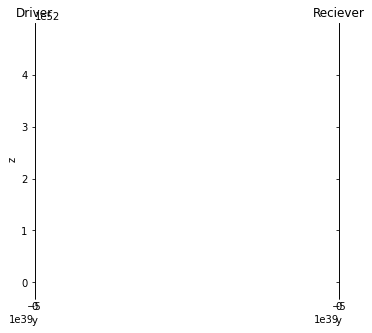

In [33]:
trans = rossler_t(0.2,0.2,9)
solt = solve_ivp(trans,(50,100),randx(3,5),max_step=0.01)
ts = solt.t
xs = solt.y
x = interp1d(ts,xs[0])
rec = rossler_r(60.2,0.2,9,x)
solr = solve_ivp(rec,(50,100),randx(3,5,dim=2),max_step=0.01)
ys = solr.y
fig, (ax0,ax1) = plt.subplots(1,2,sharex=True,sharey=True,figsize=(10,5))
ax0.set_title('Driver')
ax0.plot(*xs[[1,2]])
ax0.set_ylabel('z')
ax0.set_xlabel('y')
ax0.set_aspect(1)
ax1.set_title('Reciever')
ax1.plot(*ys)
ax1.set_xlabel('y')
ax1.set_aspect(1)
plt.savefig("lorenz.png")
plt.show()

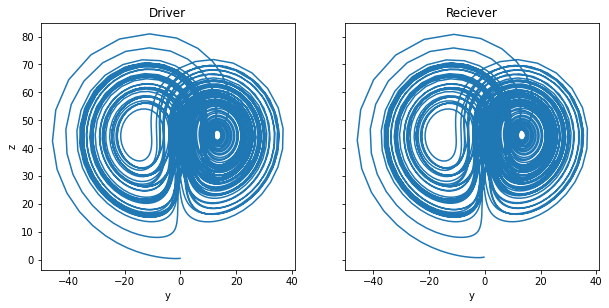

In [30]:
trans = wuchua_transmitter(16,45.6,0.98,4,np.sin)
solt = solve_ivp(trans,(50,100),randx(0.3,1),max_step=0.01)
ts = solt.t
xs = solt.y
x = interp1d(ts,xs[0]+np.sin(ts))
rec = wuchua_reciever(16,45.6,0.98,4,x)
solr = solve_ivp(rec,(50,100),randx(0.3,1),max_step=0.01)
ys = solr.y
fig, (ax0,ax1) = plt.subplots(1,2,sharex=True,sharey=True,figsize=(10,5))
ax0.set_title('Driver')
ax0.plot(*xs[[1,2]])
ax0.set_ylabel('z')
ax0.set_xlabel('y')
ax0.set_aspect(1)
ax1.set_title('Reciever')
ax1.plot(*ys[[1,2]])
ax1.set_xlabel('y')
ax1.set_aspect(1)
plt.savefig("wuchua.png")
plt.show()

In [30]:
def encrypt(audio,preborder=20,postborder=10,interp='cubic',x0=randx(0,1),s=16,r=45.6,mu=0.98,b=4,step=0.01,ma=50,perstep=100):
    raw,rate = preprocess_e(audio,preborder,postborder)
    signal = interp1d(np.arange(raw.size)/perstep,raw,kind=interp)
    time = (raw.size-1)/perstep
    truets = (1/perstep)*np.arange(raw.size)
    plt.plot(truets,raw[:])
    plt.savefig("input.png")
    plt.show()
    ts,xs,ys = encrypt_e(signal,time,x0,s,r,mu,b,step)
    plt.plot(*ys[:,:1000])
    plt.savefig("yzenc.png")
    plt.show()
    plt.plot(ts/rate,xs)
    plt.savefig("encrypted.png")
    plt.show()
    signal = interp1d(ts,xs,kind=interp)
    return postprocess_e(signal(truets),rate,ma),signal,raw.size,rate

In [10]:
def preprocess_e(audio,preborder,postborder):
    audio = audio.set_channels(1)
    rate = audio.frame_rate
    preborder = AudioSegment.silent(duration=preborder,frame_rate=rate)
    postborder = AudioSegment.silent(duration=postborder,frame_rate=rate)
    message = preborder + audio + postborder
    raw = np.array(message.get_array_of_samples())/2**(message.sample_width*8-1)
    return raw,rate

In [11]:
def encrypt_e(signal,time,x0,s,r,mu,b,step):
    sol = solve_ivp(wuchua_transmitter(s,r,mu,b,signal),(0,time),x0)#,max_step=step)
    ts = sol.t
    xs = sol.y[0]+signal(ts)
    ys = sol.y[[1,2]]
    return ts,xs,ys

In [12]:
def postprocess_e(xs,rate,ma):
    xs = np.float32(xs/ma)
    return AudioSegment(
        xs.tobytes(),
        frame_rate=rate,
        sample_width=xs.dtype.itemsize,
        channels=1
    )

In [32]:
def decrypt(signal,size,rate,interp='cubic',x0=randx(0,1),s=16,r=45.6,mu=0.98,b=4,step=0.01,ma=50,perstep=100):
    #raw,rate = preprocess_d(audio,ma)
    #signal = interp1d(np.arange(raw.size)/perstep,raw,kind=interp)
    time = (size-1)/perstep
    truets = np.arange(size)/perstep
    plt.plot(truets,signal(truets))
    plt.show()
    ts,xs,ys = decrypt_d(signal,time,x0,s,r,mu,b,step)
    plt.plot(*ys[:,:1000])
    plt.savefig("yzdec.png")
    plt.show()
    xs = signal(ts)-xs
    plt.plot(ts/rate,xs)
    plt.savefig("decrypted.png")
    plt.show()
    signal = interp1d(ts,xs,kind=interp)
    return postprocess_d(signal(truets),rate,ma)

In [14]:
def preprocess_d(audio,ma):
    rate = audio.frame_rate
    raw = np.array(audio.get_array_of_samples())/2**(audio.sample_width*8-1)
    raw = raw * ma
    return raw,rate

In [15]:
def decrypt_d(signal,time,x0,s,r,mu,b,step):
    sol = solve_ivp(wuchua_reciever(s,r,mu,b,signal),(0,time),x0)#,max_step=step)
    ts = sol.t
    xs = sol.y[0]
    ys = sol.y[[1,2]]
    return ts,xs,ys

In [16]:
def postprocess_d(xs,rate,ma):
    xs = np.float32(xs/ma)
    return AudioSegment(
        xs.tobytes(),
        frame_rate=rate,
        sample_width=xs.dtype.itemsize,
        channels=1
    )

## Let's try it!
using
On Hold For You by Kevin MacLeod

Link: https://incompetech.filmmusic.io/song/6928-on-hold-for-you

License: http://creativecommons.org/licenses/by/4.0/

(Be warned that the mask is *really* loud)

In [17]:
from IPython.display import Audio
jazz = AudioSegment.from_mp3("jazz.mp3")[:10000]
Audio("jazz.mp3")

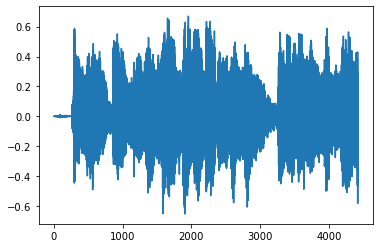

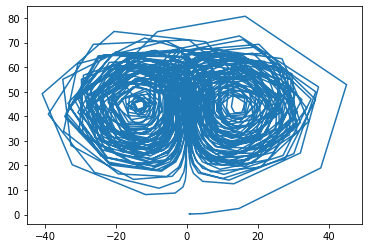

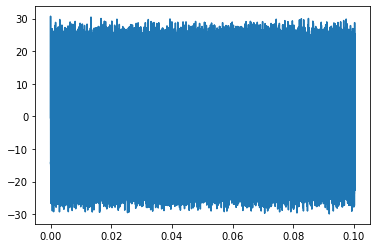

In [31]:
lostjazz,message,size,rate = encrypt(jazz)
lostjazz.export("mjazz.wav",format='wav')
Audio("mjazz.wav")

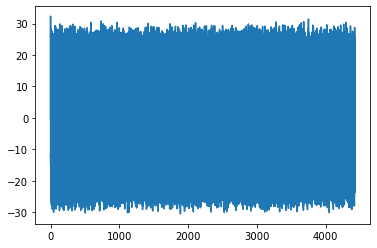

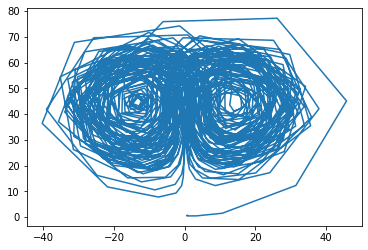

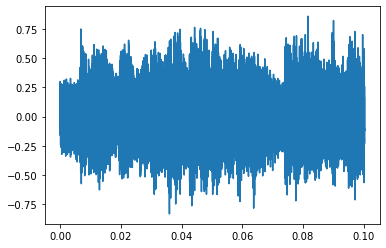

In [33]:
returnofthejazz = decrypt(message,size,rate)
returnofthejazz.export("d2jazz.wav",format='wav')
Audio("djazz.wav")